In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import pickle
import cv2
import os

## Lets first read the data

In [2]:
data_path = './data/EM_ISBI_Challenge'
train_images_folder ='train_images'
train_labels_folder ='train_labels'
test_images_folder = 'test_images'

# pixels per axis
N = 512

train_images_names = os.listdir(os.path.join(data_path,train_images_folder))
train_labels_names = os.listdir(os.path.join(data_path,train_labels_folder))
print(train_images_names)
print(train_labels_names)
train_images = np.empty((len(train_images_names)),dtype=object)
train_labels = np.empty((len(train_images_names)),dtype=object)

for i, name in enumerate(train_images_names):
    train_images[i] = cv2.imread(os.path.join(data_path,train_images_folder,name),cv2.IMREAD_GRAYSCALE)
    train_labels[i] = cv2.imread(os.path.join(data_path,train_labels_folder,train_labels_names[i]),cv2.IMREAD_GRAYSCALE)
#     train_labels[i][train_labels[i]==0] = 1
#     train_labels[i][train_labels[i]==255] = 0

['train_01.png', 'train_02.png', 'train_03.png', 'train_04.png', 'train_05.png', 'train_06.png', 'train_07.png', 'train_08.png', 'train_09.png', 'train_10.png', 'train_11.png', 'train_12.png', 'train_13.png', 'train_14.png', 'train_15.png', 'train_16.png', 'train_17.png', 'train_18.png', 'train_19.png', 'train_20.png', 'train_21.png', 'train_22.png', 'train_23.png', 'train_24.png', 'train_25.png', 'train_26.png', 'train_27.png', 'train_28.png', 'train_29.png', 'train_30.png']
['labels_01.png', 'labels_02.png', 'labels_03.png', 'labels_04.png', 'labels_05.png', 'labels_06.png', 'labels_07.png', 'labels_08.png', 'labels_09.png', 'labels_10.png', 'labels_11.png', 'labels_12.png', 'labels_13.png', 'labels_14.png', 'labels_15.png', 'labels_16.png', 'labels_17.png', 'labels_18.png', 'labels_19.png', 'labels_20.png', 'labels_21.png', 'labels_22.png', 'labels_23.png', 'labels_24.png', 'labels_25.png', 'labels_26.png', 'labels_27.png', 'labels_28.png', 'labels_29.png', 'labels_30.png']


## Visualize some of the training examples

In [3]:
def show_img(im, figsize=None, ax=None, alpha=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im, alpha=alpha)
    ax.set_axis_off()
    return ax

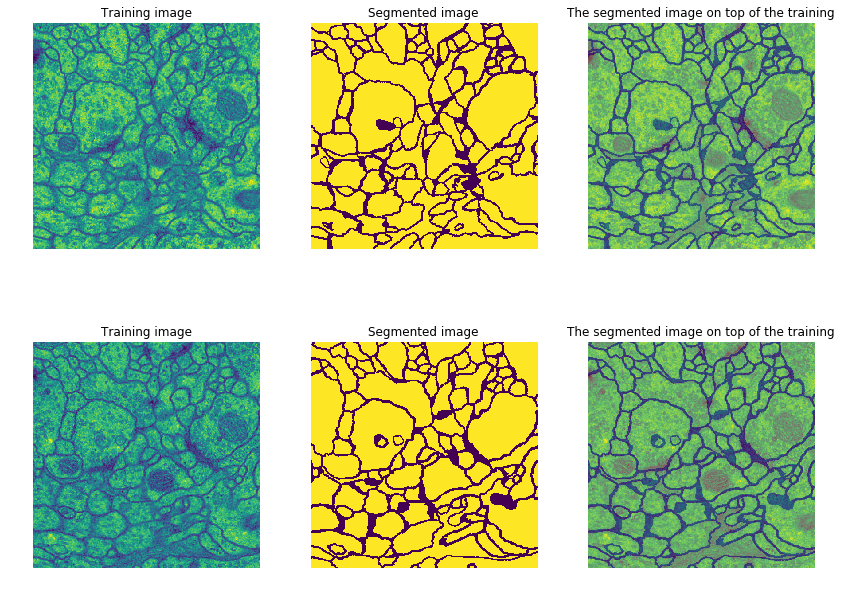

In [4]:
nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(12, 9))
for row in range(nrows):
    axes[row,0].set_title("Training image")
    axes[row,0] = show_img(train_images[row], ax=axes[row,0])
    axes[row,1].set_title("Segmented image")
    axes[row,1] = show_img(train_labels[row], ax=axes[row,1])
    axes[row,2].set_title("The segmented image on top of the training")
    axes[row,2] = show_img(train_images[row], ax=axes[row,2])
    show_img(train_labels[row], ax=axes[row,2], alpha=0.3)
fig.tight_layout()
plt.show()


## Data augmentation
Since the training data set is very tiny it would be great if we can create some other training examples. Following the recommendations of the original U-net paper we will use elastic deformation.

In [5]:
def plot_4_images(i1,i2,l1,l2):
    nrows = 2
    ncols = 2
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 9))

    axes[0,0].set_title("Original image")
    axes[0,0] = show_img(i1, ax=axes[0,0])
    axes[0,1].set_title("Augmented image")
    axes[0,1] = show_img(i2, ax=axes[0,1])

    axes[1,0].set_title("Original label")
    axes[1,0] = show_img(l1, ax=axes[1,0])
    axes[1,1].set_title("Augmented label")
    axes[1,1] = show_img(l2, ax=axes[1,1])

    plt.show()

### 1. Elastic deformation

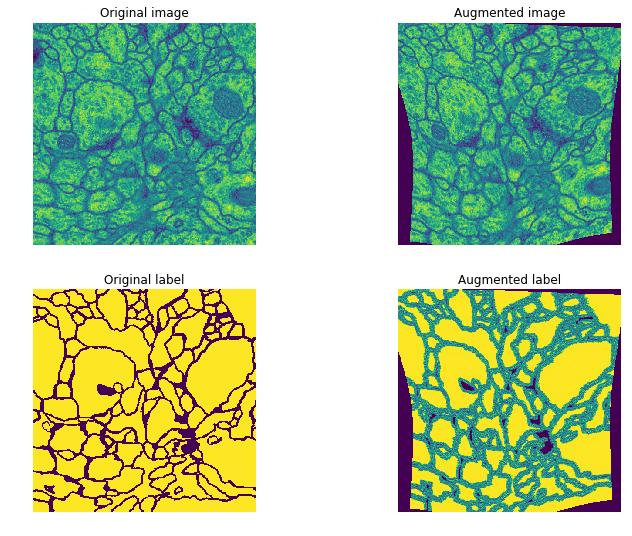

In [6]:
import elasticdeform

[X_deformed, Y_deformed] = elasticdeform.deform_random_grid([train_images[0],train_labels[0]])

plot_4_images(train_images[0],X_deformed,train_labels[0],Y_deformed)

### 2. Flipping (Mirroring)

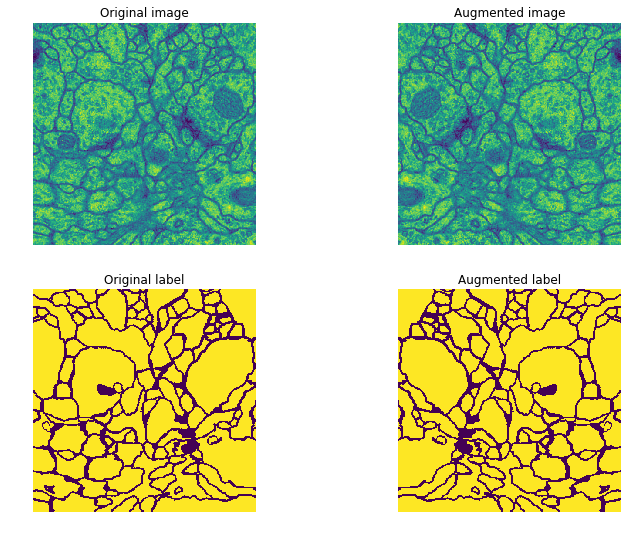

In [12]:
import torchvision.transforms.functional as TF
from PIL import Image


def mirror_horizontal(img):
    image = Image.fromarray(np.uint8(img))
    flipped = TF.hflip(image)
    return np.asarray(flipped)


plot_4_images(train_images[0],mirror_horizontal(train_images[0]),train_labels[0],mirror_horizontal(train_labels[0]))

### 3. Zoom

In [8]:
'''
Source: https://stackoverflow.com/a/48097478/9802962

I decided to improve the method by adding a corner functionality
'''

def cv2_clipped_zoom(img, zoom_factor, corner=None):
    """
    Zoom in/out of the given image and returning an enlarged/shrinked view of 
    the image without changing dimensions
    Args:
        img : Image array
        zoom_factor : amount of zoom as a ratio (0 to Inf)
        corner : if specified it ZOOM IN (WORKS ONLY FOR ZOOM IN) from the corner ["upper_(left/right)","lower_(left/right)"]
            if passed to zoom out (zoom_factor < 1) it will be ignored
    """
    height, width = img.shape[:2] # It's also the final desired shape
    new_height, new_width = int(height * zoom_factor), int(width * zoom_factor)

    ### Crop only the part that will remain in the result (more efficient)
    # Centered bbox of the final desired size in resized (larger/smaller) image coordinates
    y1, x1 = max(0, new_height - height) // 2, max(0, new_width - width) // 2
    y2, x2 = y1 + height, x1 + width
    if(None != corner and "center" != corner):
        if("upper_left" == corner):
            y1 = 0
            x1 = 0
            y2 = height
            x2 = width
        elif("upper_right" == corner):
            y1 = 0
            x1 = max(0, new_width - width)
            y2 = height
            x2 = new_width
        elif("lower_left" == corner):
            y1 = max(0, new_height - height) 
            x1 = 0
            y2 = new_height
            x2 = width
        elif("lower_right" == corner):
            y1 = max(0, new_height - height)
            x1 = max(0, new_width - width)
            y2 = new_height
            x2 = new_width
    
    bbox = np.array([y1,x1,y2,x2])
    # Map back to original image coordinates
    bbox = (bbox / zoom_factor).astype(np.int)
    y1, x1, y2, x2 = bbox
    cropped_img = img[y1:y2, x1:x2]

    # Handle padding when downscaling
    resize_height, resize_width = min(new_height, height), min(new_width, width)
    pad_height1, pad_width1 = (height - resize_height) // 2, (width - resize_width) //2
    pad_height2, pad_width2 = (height - resize_height) - pad_height1, (width - resize_width) - pad_width1
    pad_spec = [(pad_height1, pad_height2), (pad_width1, pad_width2)] + [(0,0)] * (img.ndim - 2)

    result = cv2.resize(cropped_img, (resize_width, resize_height))
    result = np.pad(result, pad_spec, mode='constant')
    assert result.shape[0] == height and result.shape[1] == width
    return result

### 3.1. Center zoom in

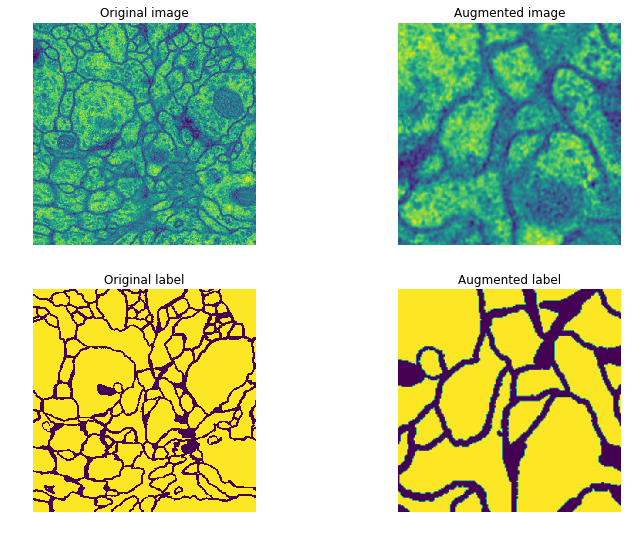

In [9]:
X_deformed = cv2_clipped_zoom(train_images[0],3)
Y_deformed = cv2_clipped_zoom(train_labels[0],3)

plot_4_images(train_images[0],X_deformed,train_labels[0],Y_deformed)

### 3.2. Corner zoom in

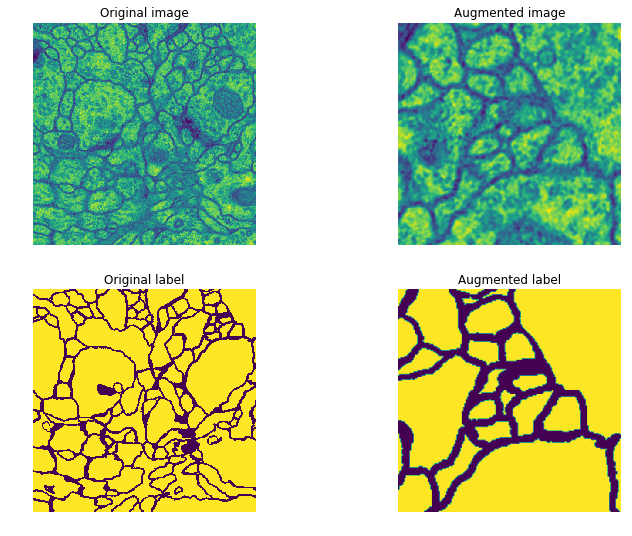

In [10]:
X_deformed = cv2_clipped_zoom(train_images[0],3,"upper_right")
Y_deformed = cv2_clipped_zoom(train_labels[0],3,"upper_right")

plot_4_images(train_images[0],X_deformed,train_labels[0],Y_deformed)

Obviously Elastic deformation does not perform well on the segmented images (the labels) so I decided to enlarge my training dataset by using flipped and zoomed images. However, I found also necessary to run a segmentation algorithm on the results returned from the zooming because noise seems to be introduced. I will pick MRF to fix the augmented label images.

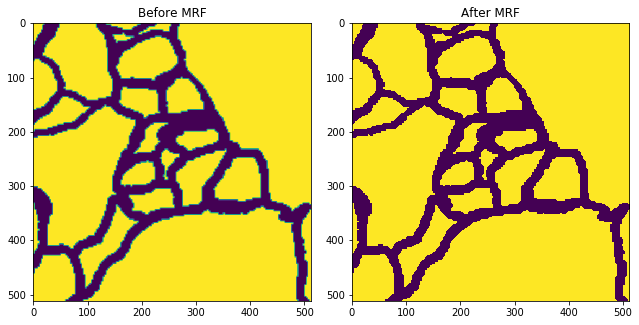

In [11]:
import maxflow

def improve_labels(label):
    mu = [0,255]
    img_flatten = label.flatten()
    flatten_length = len(img_flatten)
    beta = 100
    # Construct the graph
    G = maxflow.Graph[int](flatten_length,flatten_length)
    nodes = G.add_nodes(flatten_length)

    for i in range(flatten_length - 1):
        G.add_edge(nodes[i],nodes[i+1],beta,beta)


    # Set the capacities of the terminal edges.
    for i in range(flatten_length):
        G.add_tedge(nodes[i], (img_flatten[i]-mu[0])**2, (img_flatten[i]-mu[1])**2)

    # Run the max flow algorithm
    flow = G.maxflow()

    seg = np.zeros(img_flatten.shape,dtype=np.uint8)

    for i in range(flatten_length):
        seg[i] = G.get_segment(nodes[i])

    seg = seg.reshape(label.shape)
    # flip the values
    seg[seg==1] = 2
    seg[seg==0] = 255
    seg[seg==2] = 0
    
    return seg

res = improve_labels(Y_deformed)

fig = plt.figure(figsize=(9,4.5))
ax = fig.add_subplot(1,2,1)
im = ax.imshow(Y_deformed)
ax.set_title('Before MRF')

ax = fig.add_subplot(1,2,2)
im = ax.imshow(res)
ax.set_title('After MRF')
fig.tight_layout()
plt.show()


## Creating a dataset

Creating a dataset in pytorch is pretty straightforward we just need to implement an interface defined by <b>Dataset</b> that can be found in torch.utils.data.

In [13]:
# We have

len(train_images)

# images in our train set I decided to expand the train set up to 90

30

Lets add all the transformations into a single array

In [14]:
import random

def zoom_transformation(img, label):
    corner_options = ["center","upper_left","upper_right","lower_left","lower_right"]
    zoom_factor = np.random.uniform(1,4)
    
    random_corner_option = random.choice(corner_options)
    zoomed_img = cv2_clipped_zoom(img,zoom_factor,random_corner_option)
    zoomed_label = cv2_clipped_zoom(label,zoom_factor,random_corner_option)
    
    zoomed_label = improve_labels(zoomed_label)
    
    return (zoomed_img,zoomed_label)
    

I prefer to apply the augmentation before actually passing it to the Dataset class

<b>THIS TAKES TIME</b>

In [16]:
p_apply = 0.6

augmented_length = 2* len(train_images)
augmented_images = np.empty((augmented_length),dtype=object)
augmented_labels = np.empty((augmented_length),dtype=object)
index = 0

# First we zoom some of the images
while(index < augmented_length):
    # we take a random index of X
    random_index = np.random.randint(len(train_images))

    zoomed_img, zoomed_label = zoom_transformation(train_images[random_index],train_labels[random_index])

    # we choose whether to apply it with P(apply) = p_apply
    choose = np.random.uniform()
    if(choose > (1-p_apply)):
        augmented_images[index] = zoomed_img
        augmented_labels[index] = zoomed_label
        index += 1
        
print("Zooming augmentation ready")

# we concatenate both data sets
imgs = np.concatenate([train_images,augmented_images],axis = 0)
labels = np.concatenate([train_labels,augmented_labels],axis = 0)

# apply mirroring of some of them        
mirrored_imgs = np.empty((int(len(train_images)/2)),dtype=object)
mirrored_labels = np.empty((int(len(train_labels)/2)),dtype=object)

index = 0
while(index < len(mirrored_imgs)):
    random_index = np.random.randint(len(imgs))

    choose = np.random.uniform()
    if(choose > (1-p_apply)):
        mirrored_imgs[index] = mirror_horizontal(imgs[random_index])
        mirrored_labels[index] = mirror_horizontal(labels[random_index])
        index += 1
        
print("Mirroring augmentation ready")

imgs = np.concatenate([imgs,mirrored_imgs],axis = 0)
labels = np.concatenate([labels,mirrored_labels],axis = 0)

Zooming augmentation ready
Mirroring augmentation ready


In [18]:
len(labels)

105

In [19]:
# lets now shuffle the elements
number_list = np.arange(len(imgs))
np.random.shuffle(number_list)
imgs = imgs[number_list]
labels = labels[number_list]

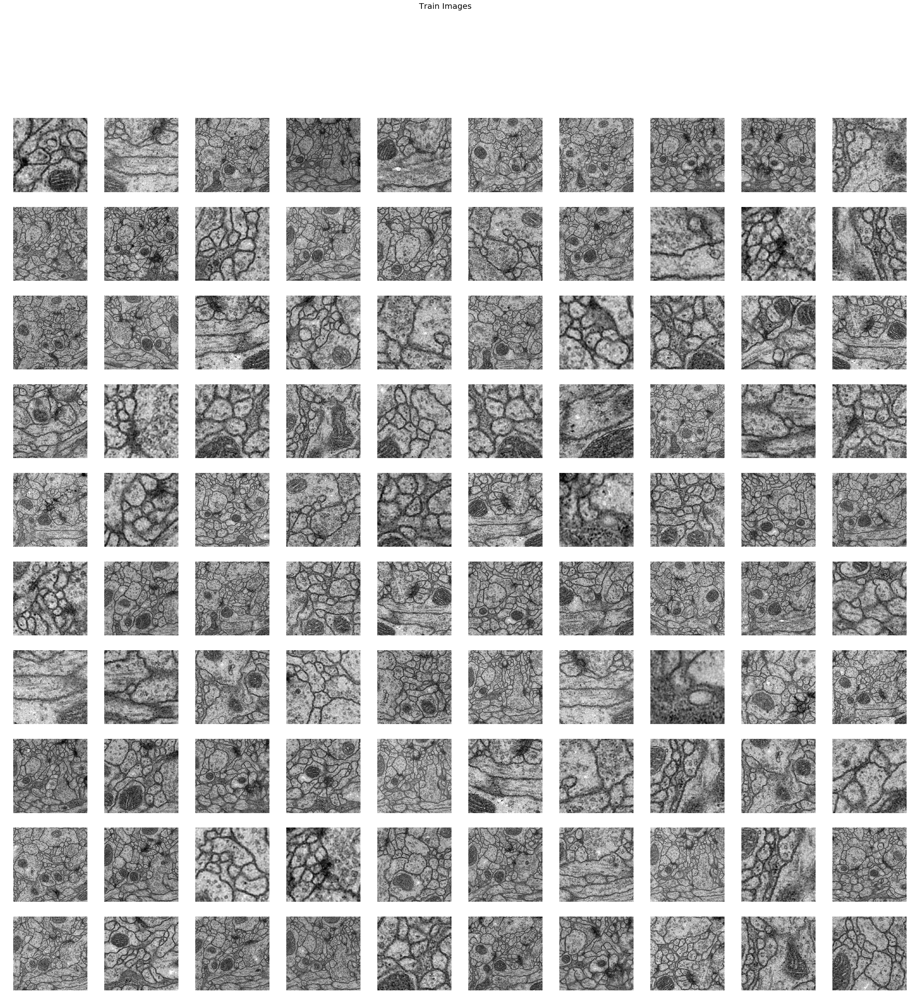

In [27]:
# Lets plot some of the resulted images
fig, ax = plt.subplots(nrows=10, ncols=10,figsize=(40,40))
fig.suptitle('Train Images', fontsize=20)
idx = 0
for row in ax:
    for col in row:
        image = imgs[idx]
        col.imshow(image, cmap='gray')
        col.axis('off')
        idx+=1
        if(99 == idx):
            col.set_axis_off()
plt.show()

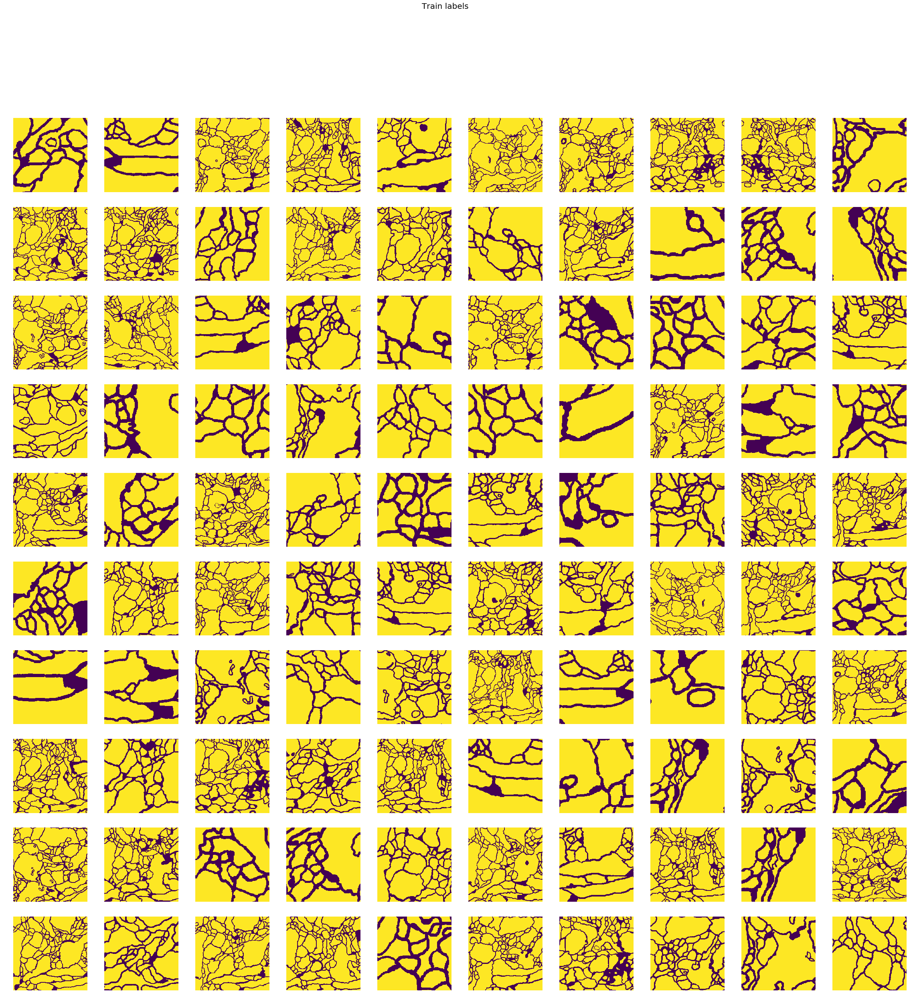

In [28]:
fig, ax = plt.subplots(nrows=10, ncols=10,figsize=(40,40))
fig.suptitle('Train labels', fontsize=20)
idx = 0
for row in ax:
    for col in row:
        image = labels[idx]
        col.imshow(image)
        col.axis('off')
        idx+=1
        if 104 == idx:
            col.set_axis_off()
        
plt.show()

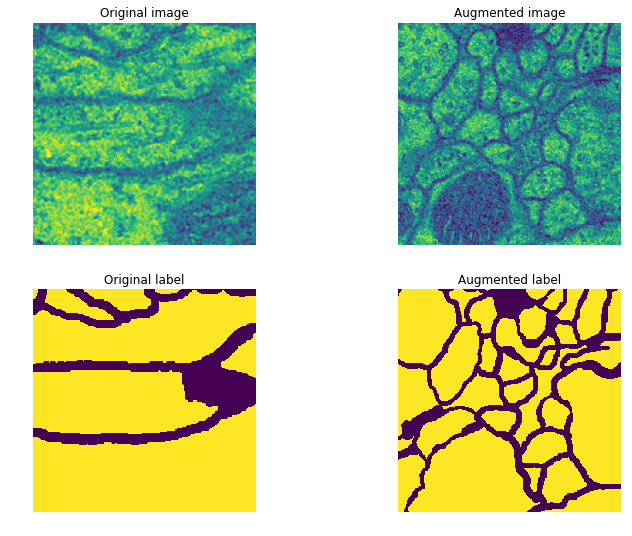

In [26]:
# lets better see if the images match with the labels
plot_4_images(imgs[60],imgs[102],labels[60],labels[102])

In [30]:
from torch.utils.data import Dataset

class NeuronalData(Dataset):
    def __init__(self, X, y):
        self.imgs = X
        self.labels = y               
        
    def __len__(self):
        return len(self.imgs)
    
    def __getitem__(self, index):
        return (self.imgs[index],self.labels[index])